In [141]:
import cv2 as cv
import numpy as np
import tarfile
import skimage
import os
from PIL import Image
from skimage import filters
from skimage import morphology
from scipy import ndimage as ndi
from skimage.filters.rank import gradient
from skimage.morphology import disk
from skimage import exposure
from skimage.exposure import histogram, cumulative_distribution, equalize_hist, match_histograms, is_low_contrast
from skimage import color
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import imutils
from scipy.spatial import distance as dist
from collections import OrderedDict
import copy
import PIL.Image

In [142]:
from others.imAugment import *

In [143]:
def plotMultipleImages(nrows, ncols, images, titles, cmap, size=(20,20)):
    fig = plt.figure(figsize=(size[0],size[1]))
    fig.subplots_adjust(hspace=0.2, wspace=0.3)
    for i in range(len(titles)):
        ax = fig.add_subplot(nrows, ncols, i+1)
        if cmap[i]=='rgb':
            ax.imshow(images[i])
        else:
            ax.imshow(images[i], cmap=cmap[i])
        ax.set_title(titles[i])
    plt.show()
    
def plot_single(im, cmap='rgb'):
    fig, ax = plt.subplots(figsize=(13, 13))
    if cmap=='rgb':
        ax.imshow(im)
    else:
        ax.imshow(im, cmap=cmap)
    ax.axis('on')
    plt.show()
    
def enhance_im(rgb_in_im, alpha=1, beta=0):
    #new_im = np.zeros(old_im.shape, old_im.dtype)
    hsv_in_im = cv.cvtColor(rgb_in_im, cv.COLOR_RGB2HSV)
    h, s, v = cv.split(hsv_in_im)
    v = cv.convertScaleAbs(v, alpha=alpha, beta=beta)
    hsv_out_im = cv.merge((h,s,v))
    rgb_out_im = cv.cvtColor(hsv_out_im, cv.COLOR_HSV2RGB)
    
    return rgb_out_im.astype(np.uint8)

In [144]:
def load_img(path):
    img_dict = {}
    for file in os.listdir(path):
        if file.endswith('.jpg'):
            img_dict[int(file.split('.jpg')[0].split('_')[1])] = PIL.Image.open(os.path.join(path, file)) # size = (H=4000, W=6000), mode = RGB
    return img_dict 
train_images = load_img(os.path.join("data", "train"))

# dict_keys([17, 1, 3, 7, 14, 24, 10, 2, 15, 11, 23, 18, 9, 13, 12, 21, 5, 22, 20, 27, 19, 8, 16, 25, 26, 6, 0, 4])
# image 1 gives the best view, we take it as the reference
ref_img = np.array(train_images[0])

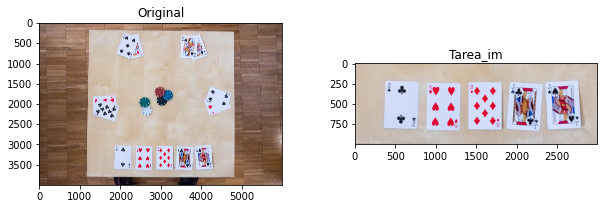

In [145]:
Tarea_im = ref_img[2800:3800, 1500:4500]
plotMultipleImages(1, 2, [ref_img, Tarea_im], ['Original', 'Tarea_im'], ['rgb']*2, (10, 10)) 

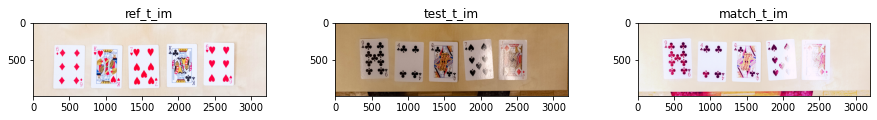

In [146]:
ref_img = np.array(train_images[3])
ref_t_im = ref_img[2800:3800, 1500:4700]
test_img = np.array(train_images[8])
test_t_im = test_img[2800:3800, 1500:4700]
match_t_im = match_histograms(test_t_im, ref_t_im, multichannel=True).astype(np.uint8)
plotMultipleImages(1, 3, [ref_t_im, test_t_im, match_t_im], ['ref_t_im', 'test_t_im', 'match_t_im'], ['rgb']*3, (15, 15)) 

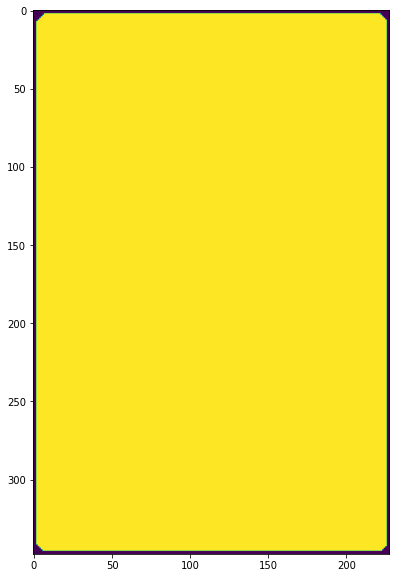

In [159]:
#%% card parameters
cardW = 57
cardH = 87
cornerXmin = 2
cornerXmax = 10.5
cornerYmin = 2.5
cornerYmax = 23

# We convert the measures from mm to pixels: multiply by an arbitrary factor 'zoom'
# You shouldn't need to change this
zoom = 4
cardW *= zoom
cardH *= zoom
cornerXmin = int(cornerXmin * zoom)
cornerXmax = int(cornerXmax * zoom)
cornerYmin = int(cornerYmin * zoom)
cornerYmax = int(cornerYmax * zoom)

refCard = np.array([[0, 0], [cardW, 0], [cardW, cardH], [0, cardH]], dtype=np.float32)
refCardRot = np.array(
    [[cardW, 0], [cardW, cardH], [0, cardH], [0, 0]], dtype=np.float32
)

#%% construct alphamask
# clean the border of the detected cards
# make that border transparent. Cards are not perfect rectangles because corners are rounded. We need to make transparent the zone between the real card and its bounding rectangle, otherwise this zone will be visible in the final generated images of the dataset
bord_size = 2  # bord_size alpha=0
alphamask = np.ones((cardH, cardW), dtype=np.uint8) * 255
cv.rectangle(alphamask, (0, 0), (cardW - 1, cardH - 1), 0, bord_size)
cv.line(alphamask, (bord_size * 3, 0), (0, bord_size * 3), 0, bord_size)
cv.line(alphamask, (cardW - bord_size * 3, 0), (cardW, bord_size * 3), 0, bord_size)
cv.line(alphamask, (0, cardH - bord_size * 3), (bord_size * 3, cardH), 0, bord_size)
cv.line(
    alphamask,
    (cardW - bord_size * 3, cardH),
    (cardW, cardH - bord_size * 3),
    0,
    bord_size,
)
plt.figure(figsize=(10, 10))
plt.imshow(alphamask)
plt.show()

In [248]:
from scipy.signal import wiener

In [282]:
def extract_card(Tarea_im, output_fn=None, debug=False):
    """ """
    scale_precent =30
    width = int(Tarea_im.shape[1] * scale_precent/100)
    height = int(Tarea_im.shape[0] * scale_precent/100)
    dim = (width, height)
    img = cv.resize(Tarea_im, dim, interpolation=cv.INTER_AREA)

    gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
    dst = cv.equalizeHist(gray)
    
    gaussian = cv.GaussianBlur(dst, (11, 11), 0)
    gaussian = cv.GaussianBlur(gaussian, (1, 1), 0)
    threshold1 = 175
    threshold2 = 0
    
    edges = cv.Canny(gaussian, threshold1, threshold2)
    
    h, w, ch = img.shape
    contours, hierarchy = cv.findContours(edges, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=lambda c: cv.arcLength(c, False),reverse=True)[:7]  
    convex_im = np.zeros((h, w, ch), dtype=np.uint8)
    
    convexHulls = []
    
    for contour in contours:
        convexHull = cv.convexHull(contour)
        convexHulls.append(convexHull)
        
    convexHulls_sorted = sorted(convexHulls, key=cv.contourArea,reverse=True)[:5]
    
    imgwarp = None
    # We want to check that 'cnt' is the contour of a rectangular shape
    # First, determine 'box', the minimum area bounding rectangle of 'cnt'
    # Then compare area of 'cnt' and area of 'box'
    # Both areas sould be very close
    
    rect_contour = []
    
    for contour in convexHulls_sorted:
        #print(cv.contourArea(contour))
        rect = cv.minAreaRect(contour)
        box = cv.boxPoints(rect)
        box = np.int0(box)
        rect_contour.append(box)

    
    imgwarps_dict = {}
    for contour in rect_contour:
        rect = cv.minAreaRect(contour)
        box = cv.boxPoints(rect)
        box = np.int0(box)
        
        mean_x = int(np.mean(box, axis=0)[0])
        
        # We want transform the zone inside the contour into the reference rectangle of dimensions (cardW,cardH)
        ((xr, yr), (wr, hr), thetar) = rect
        # Determine 'Mp' the transformation that transforms 'box' into the reference rectangle
        if wr > hr:
            Mp = cv.getPerspectiveTransform(np.float32(box), refCard)
        else:
            Mp = cv.getPerspectiveTransform(np.float32(box), refCardRot)
        # Determine the warped image by applying the transformation to the image
        imgwarp = cv.warpPerspective(img, Mp, (cardW, cardH))
        
        # Add alpha layer
        imgwarp = cv.cvtColor(imgwarp, cv.COLOR_RGB2RGBA)

        # Shape of 'cnt' is (n,1,2), type=int with n = number of points
        # We reshape into (1,n,2), type=float32, before feeding to perspectiveTransform
        cnta = contour.reshape(1, -1, 2).astype(np.float32)
        # Apply the transformation 'Mp' to the contour
        cntwarp = cv.perspectiveTransform(cnta, Mp)
        cntwarp = cntwarp.astype(np.int)

        # We build the alpha channel so that we have transparency on the
        # external border of the card
        # First, initialize alpha channel fully transparent
        alphachannel = np.zeros(imgwarp.shape[:2], dtype=np.uint8)
        # Then fill in the contour to make opaque this zone of the card
        cv.drawContours(alphachannel, cntwarp, 0, 255, -1)

        # Apply the alphamask onto the alpha channel to clean it
        alphachannel = cv.bitwise_and(alphachannel, alphamask)

        # Add the alphachannel to the warped image
        imgwarp[:, :, 3] = alphachannel

        # Save the image to file
        if output_fn is not None:
            cv.imwrite(output_fn, imgwarp)
            
        #imgwarps.append(imgwarp)
        imgwarps_dict[mean_x] = imgwarp
        
    # sort the dict
    imgwarps = []
    #print(sorted(imgwarps_dict.keys()))
    sharpen_kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
    for key in sorted(imgwarps_dict.keys()):
        sharpen = cv.filter2D(imgwarps_dict[key], -1, sharpen_kernel)
        sharpen = cv.cvtColor(sharpen, cv.COLOR_RGBA2RGB)
        imgwarps.append(sharpen)

    return imgwarps

In [283]:
ori_test_img = np.array(train_images[0])
Tarea_im = ori_test_img[2800:3700, 1500:4600]
imgwarps = extract_card(Tarea_im)

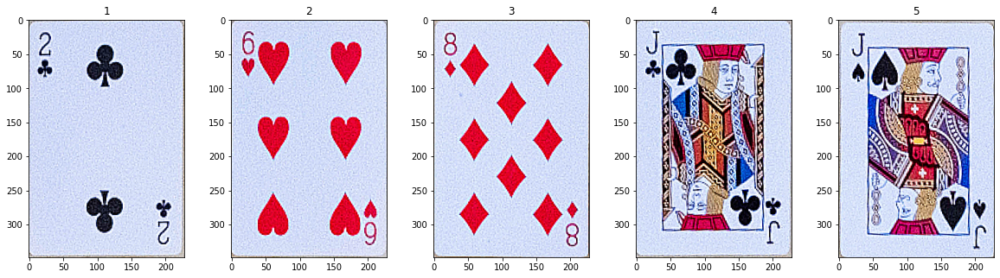

In [284]:
plotMultipleImages(1, 5, imgwarps, \
                           ['1','2','3','4','5'],\
                           ['rgb']*5, (20,20))

In [291]:
imgwarps[0].shape

(348, 228, 3)

In [300]:
from numpy import save

In [301]:
output_T = np.zeros((140, 348, 228, 3))
for img_ID in range(0,28):
    ori_test_img = np.array(train_images[img_ID])
    Tarea_im = ori_test_img[2800:3700, 1500:4600]
    imgwarps = extract_card(Tarea_im)
    for ind, img in enumerate(imgwarps):
        output_T[img_ID*5+ind] = img
save('Tcards.npy', output_T)    
print("finished")

NameError: name 'finished' is not defined

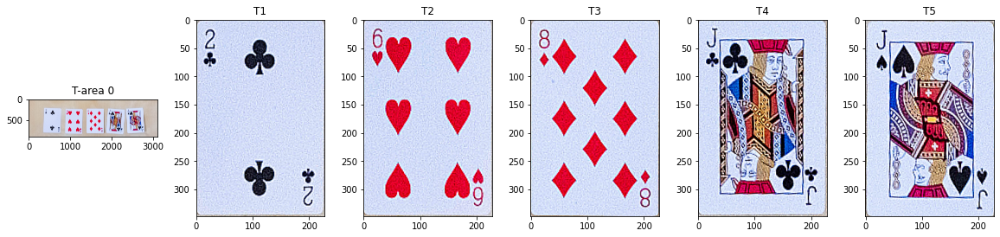

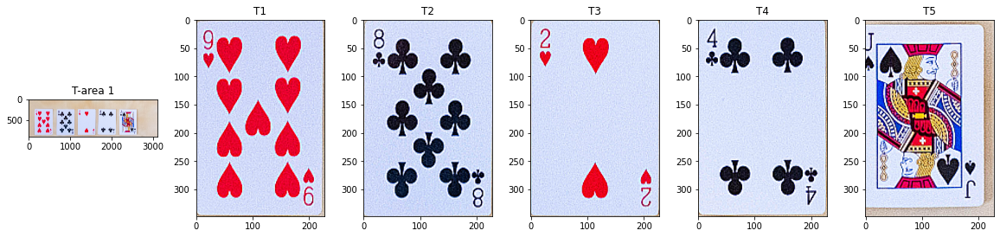

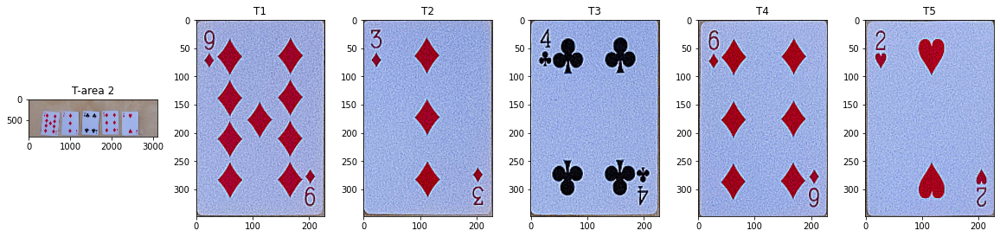

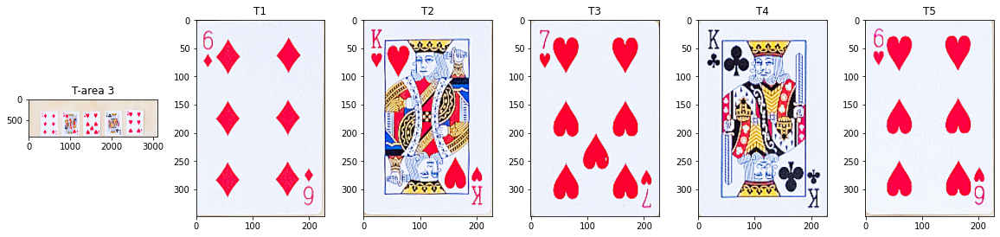

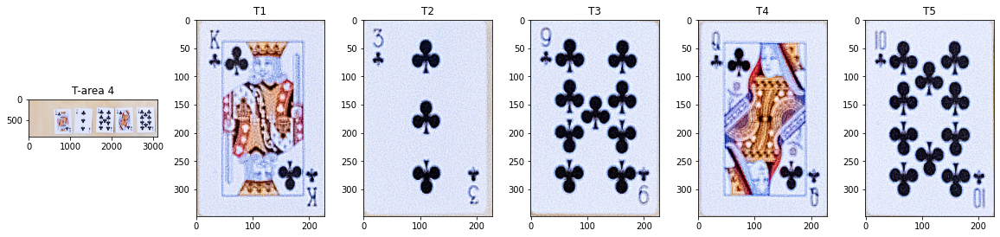

...

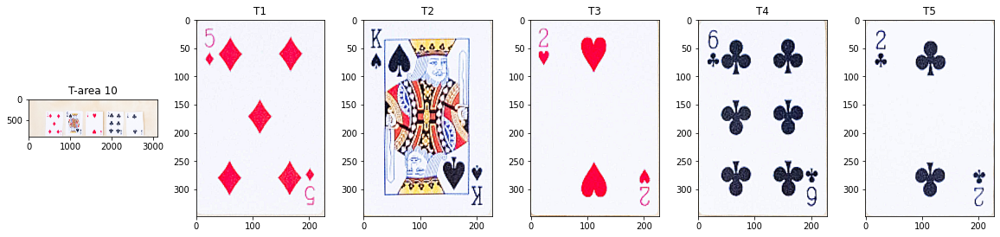

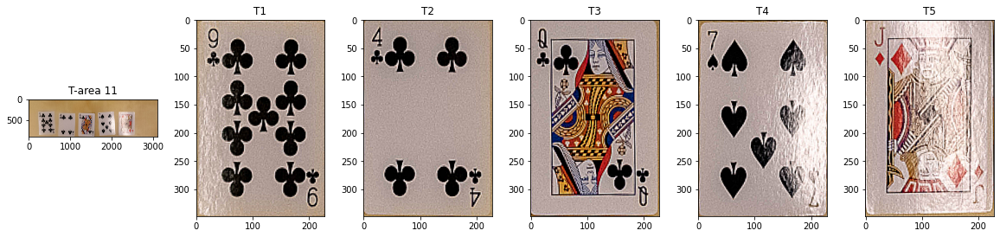

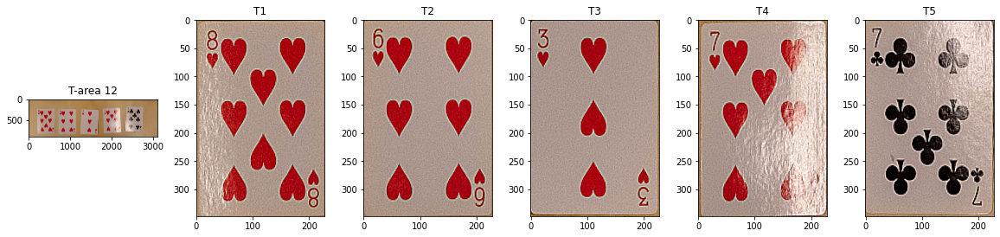

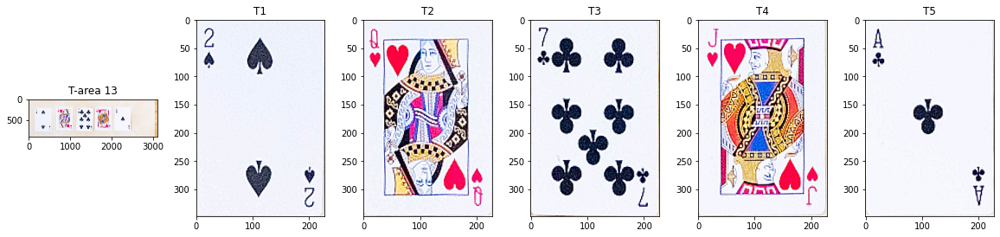

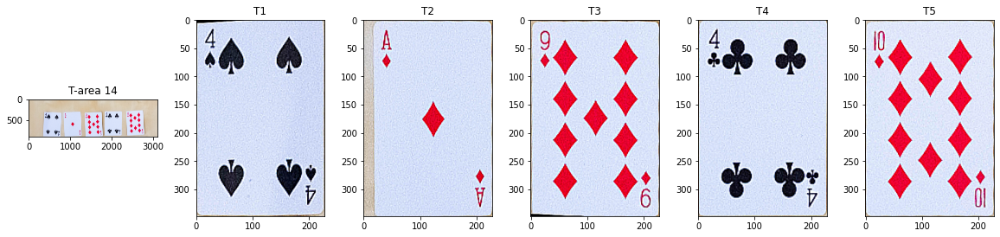

In [285]:
for img_ID in range(0, 15):
    ori_test_img = np.array(train_images[img_ID])
    Tarea_im = ori_test_img[2800:3700, 1500:4600]
    imgwarps = extract_card(Tarea_im)
    
    plot_imgs = [Tarea_im]+imgwarps
    imgs_name = ['T-area {}'.format(img_ID), 'T1', 'T2', 'T3', 'T4', 'T5']
    plotMultipleImages(1, 6, plot_imgs, imgs_name, ['rgb']*6, (20,20))
    

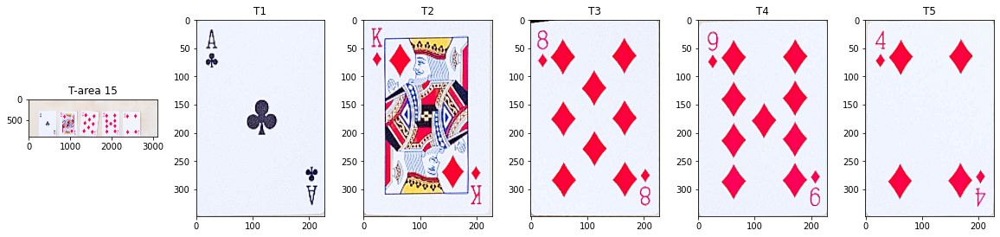

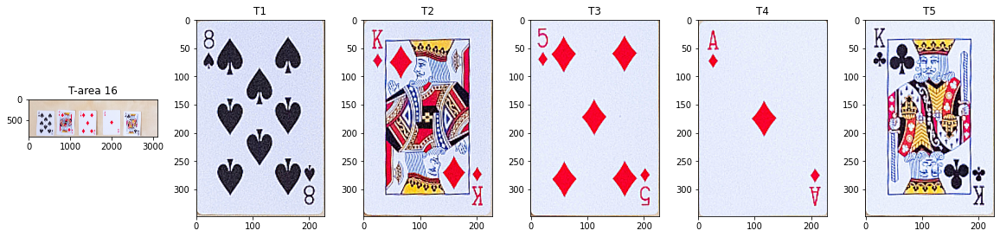

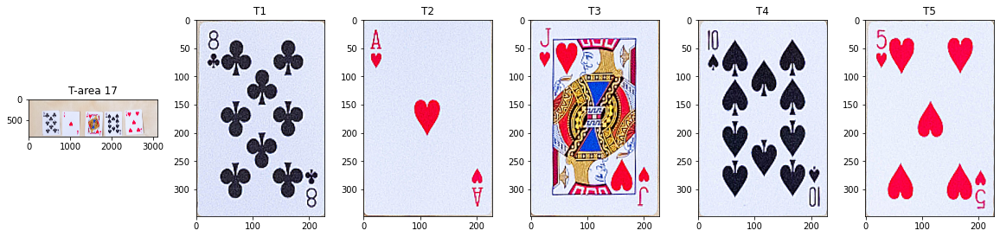

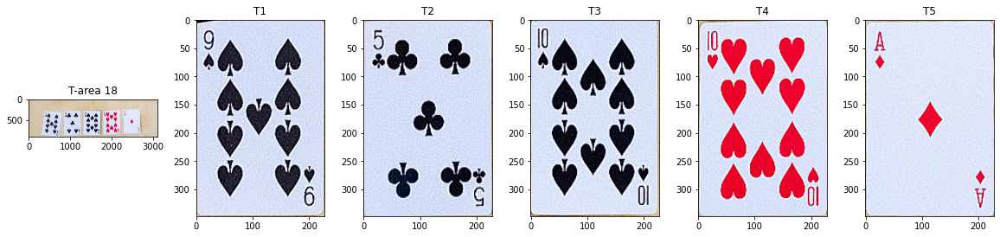

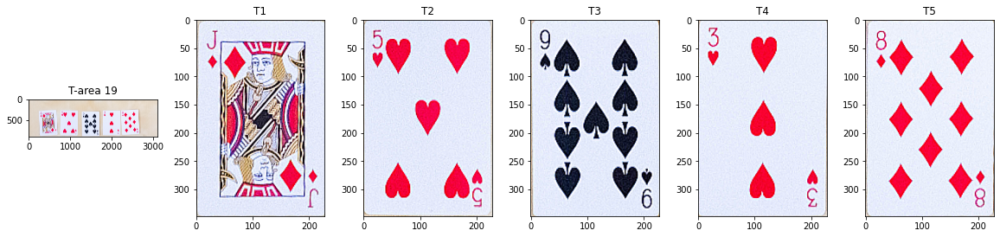

...

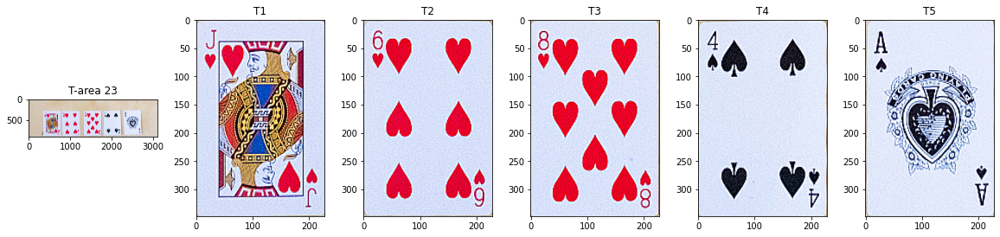

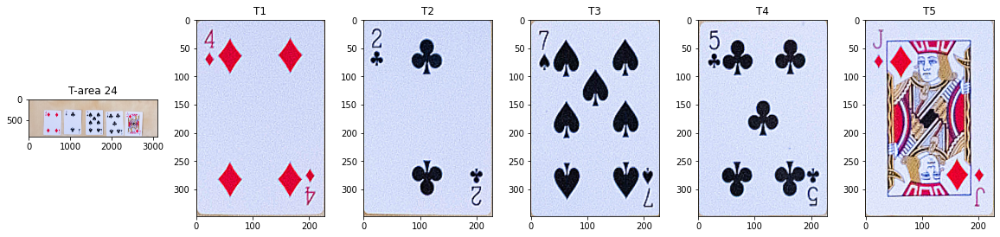

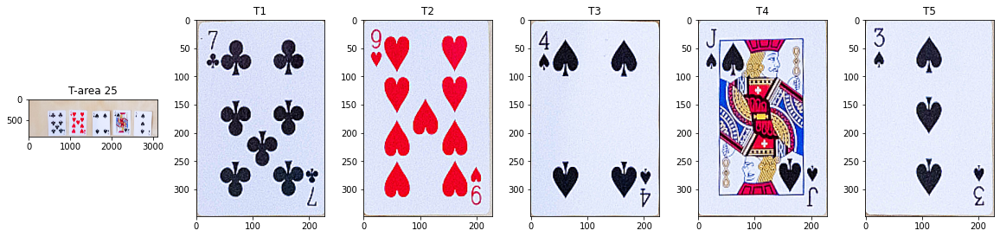

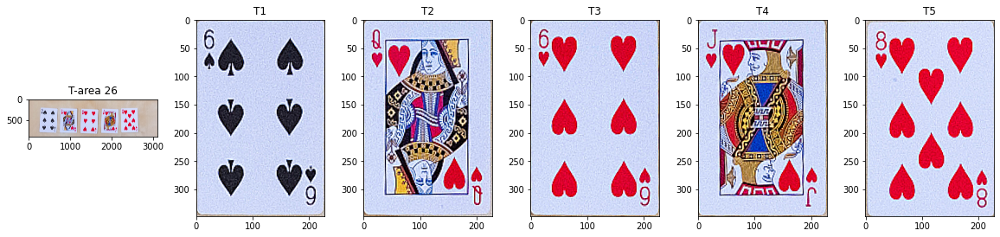

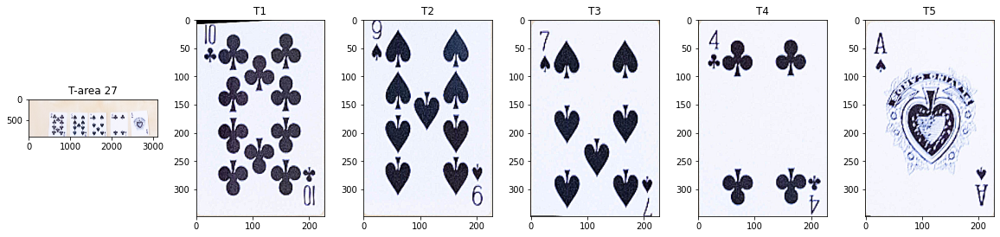

In [286]:
for img_ID in range(15, 28):
    ori_test_img = np.array(train_images[img_ID])
    Tarea_im = ori_test_img[2800:3700, 1500:4600]
    imgwarps = extract_card(Tarea_im)
    
    plot_imgs = [Tarea_im]+imgwarps
    imgs_name = ['T-area {}'.format(img_ID), 'T1', 'T2', 'T3', 'T4', 'T5']
    plotMultipleImages(1, 6, plot_imgs, imgs_name, ['rgb']*6, (20,20))
    

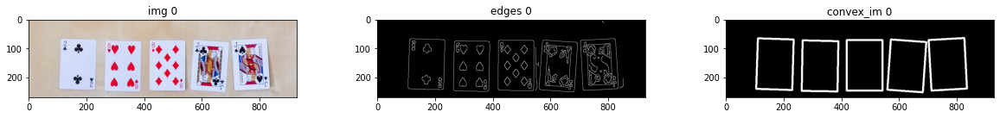

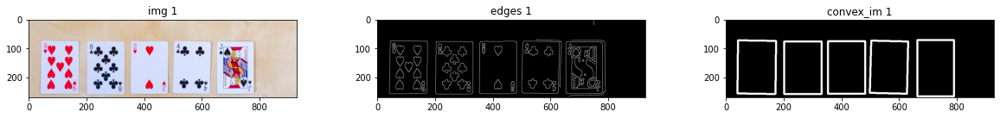

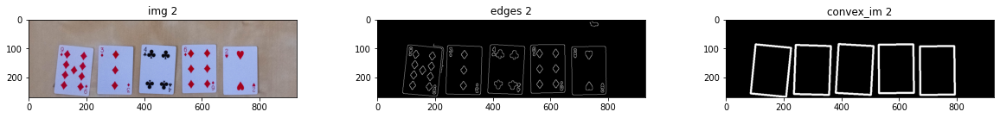

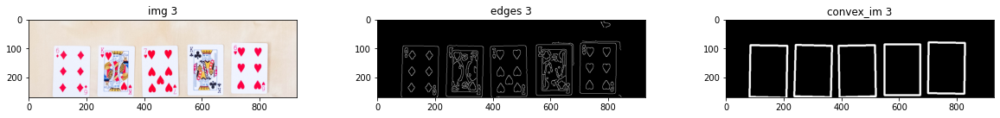

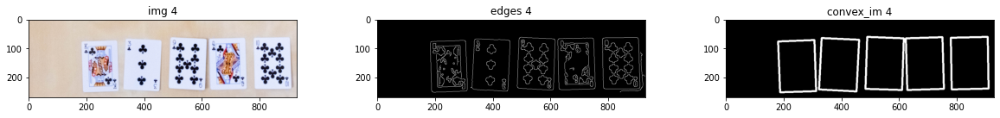

...

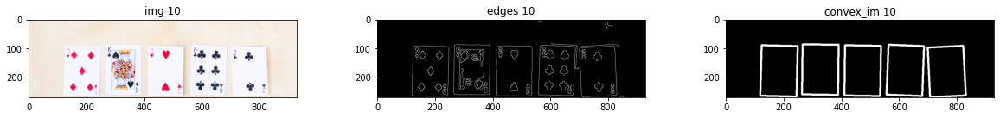

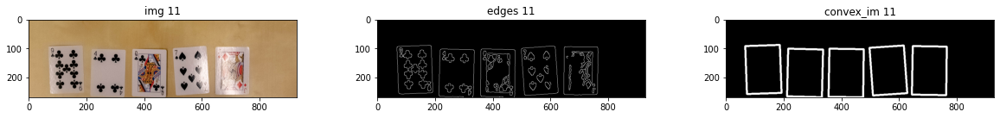

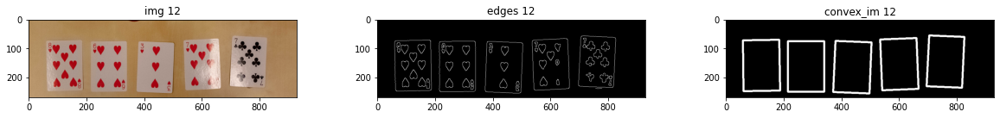

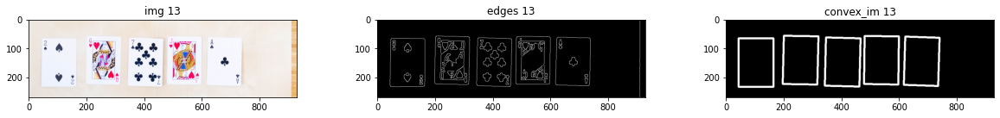

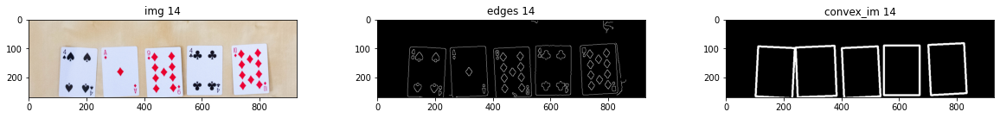

In [281]:
for img_ID in range(0, 15):
    ori_test_img = np.array(train_images[img_ID])
    Tarea_im = ori_test_img[2800:3700, 1500:4600]
    
    scale_precent =30
    width = int(Tarea_im.shape[1] * scale_precent/100)
    height = int(Tarea_im.shape[0] * scale_precent/100)
    dim = (width, height)
    img = cv.resize(Tarea_im, dim, interpolation=cv.INTER_AREA)

    gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
    dst = cv.equalizeHist(gray)
    
    gaussian = cv.GaussianBlur(dst, (11, 11), 0)
    gaussian = cv.GaussianBlur(gaussian, (1, 1), 0)
    threshold1 = 175 #175
    threshold2 = 0
    
    edges = cv.Canny(gaussian, threshold1, threshold2)
    
    h, w, ch = img.shape
    contours, hierarchy = cv.findContours(edges, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=lambda c: cv.arcLength(c, False),reverse=True)[:7]  
    convex_im = np.zeros((h, w, ch), dtype=np.uint8)
    
    convexHulls = []
    
    for contour in contours:
        convexHull = cv.convexHull(contour)
        convexHulls.append(convexHull)
        
    convexHulls_sorted = sorted(convexHulls, key=cv.contourArea,reverse=True)[:5]  
    for contour in convexHulls_sorted:
        #print(cv.contourArea(contour))
        rect = cv.minAreaRect(contour)
        box = cv.boxPoints(rect)
        box = np.int0(box)
        cv.drawContours(convex_im, [box], -1, (255, 255, 255), 5)

    plotMultipleImages(1, 3, [img, edges, convex_im], \
                           ['img {}'.format(img_ID), 'edges {}'.format(img_ID), 'convex_im {}'.format(img_ID)],\
                           ['rgb', 'gray', 'gray'], (20,20))
    

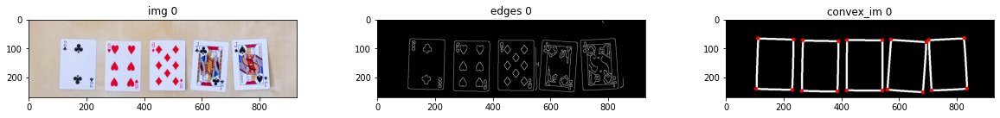

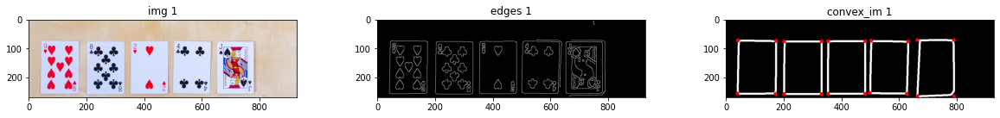

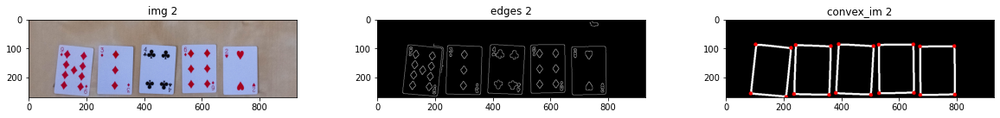

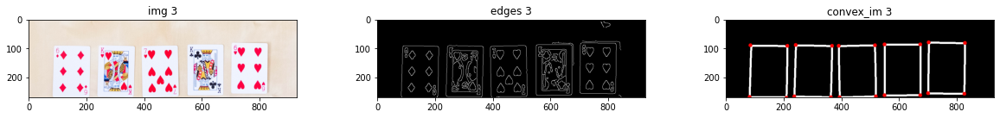

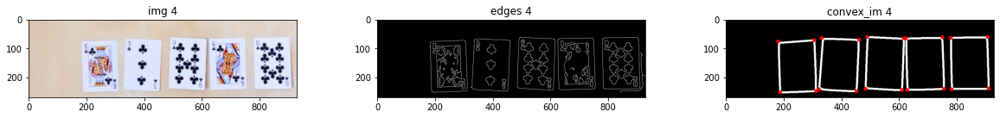

...

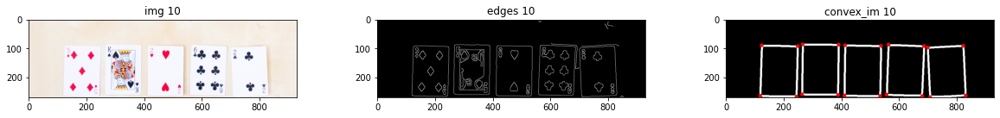

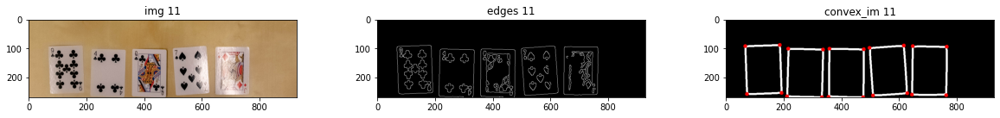

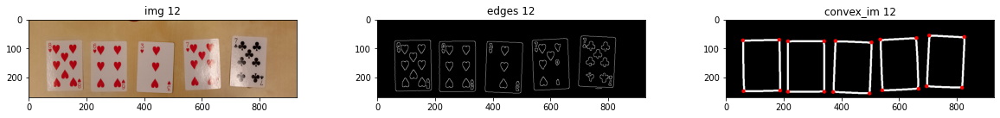

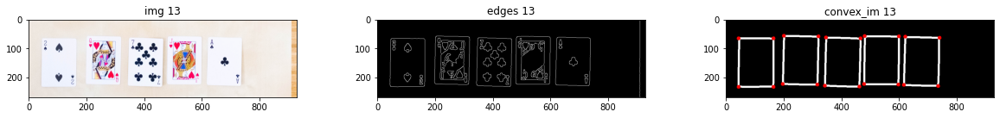

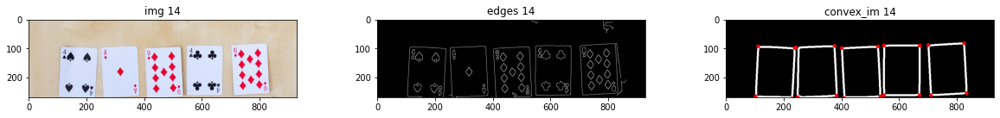

In [157]:
for img_ID in range(0, 15):
    ori_test_img = np.array(train_images[img_ID])
    Tarea_im = ori_test_img[2800:3700, 1500:4600]
    
    scale_precent =30
    width = int(Tarea_im.shape[1] * scale_precent/100)
    height = int(Tarea_im.shape[0] * scale_precent/100)
    dim = (width, height)
    img = cv.resize(Tarea_im, dim, interpolation=cv.INTER_AREA)

    gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
    dst = cv.equalizeHist(gray)
    
    gaussian = cv.GaussianBlur(dst, (11, 11), 0)
    gaussian = cv.GaussianBlur(gaussian, (1, 1), 0)
    threshold1 = 175
    threshold2 = 0
    
    edges = cv.Canny(gaussian, threshold1, threshold2)
    
    h, w, ch = img.shape
    contours, hierarchy = cv.findContours(edges, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=lambda c: cv.arcLength(c, False),reverse=True)[:7]  
    convex_im = np.zeros((h, w, ch), dtype=np.uint8)
    
    convexHulls = []
    
    for contour in contours:
        convexHull = cv.convexHull(contour)
        convexHulls.append(convexHull)
        
    convexHulls_sorted = sorted(convexHulls, key=cv.contourArea,reverse=True)[:5]  
    for contour in convexHulls_sorted:
        #print(cv.contourArea(contour))
        cv.drawContours(convex_im, [contour], -1, (255, 255, 255), 5)
        
        rect=cv.minAreaRect(contour)
        box=cv.boxPoints(rect)
        for i in box:
            cv.circle(convex_im, (int(i[0]),int(i[1])), 3, (255, 0, 0), 5)
        
    plotMultipleImages(1, 3, [img, edges, convex_im], \
                           ['img {}'.format(img_ID), 'edges {}'.format(img_ID), 'convex_im {}'.format(img_ID)],\
                           ['rgb', 'gray', 'gray'], (20,20))
    

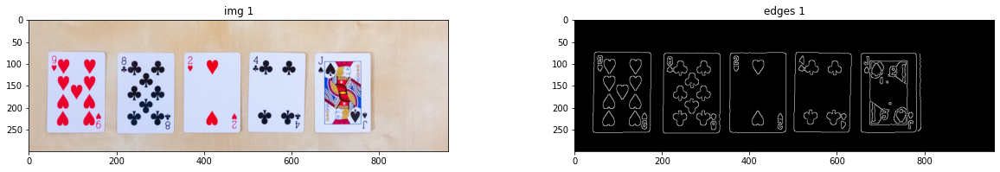

In [73]:
img_ID = 1
ori_test_img = np.array(train_images[img_ID])
Tarea_im = ori_test_img[2800:3800, 1500:4700]

scale_precent =30
width = int(Tarea_im.shape[1] * scale_precent/100)
height = int(Tarea_im.shape[0] * scale_precent/100)
dim = (width, height)
img = cv.resize(Tarea_im, dim, interpolation=cv.INTER_AREA)

gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
dst = cv.equalizeHist(gray)
gaussian = cv.GaussianBlur(dst, (9, 9), 0)

threshold1 = 255
threshold2 = 50
edges = cv.Canny(gaussian, threshold1, threshold2)
plotMultipleImages(1, 2, [img, edges], \
                           ['img {}'.format(img_ID), 'edges {}'.format(img_ID)],\
                           ['rgb', 'gray'], (20,20))

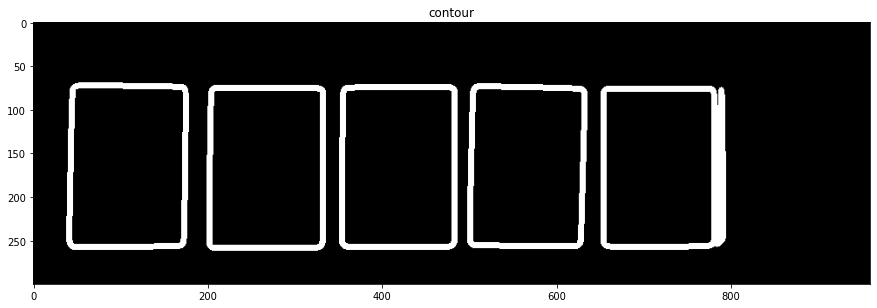

In [76]:
h, w, ch = img.shape
contours, hierarchy = cv.findContours(edges, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
obj_img = np.zeros((h, w, ch), dtype=np.uint8)
#c = max(contours, key = cv.contourArea)
for contour in contours:
    convexHull = cv.convexHull(contour)
    cv.drawContours(obj_img, [convexHull], -1, (255, 255, 255), 5)

#cv.drawContours(obj_img, c, -1, [255,255,255], thickness=5)
plotMultipleImages(1, 1, [obj_img], ['contour'], ['gray'], (15, 15)) 